Información integrantes del equipo de trabajo

**Nombre y apellidos (Grupo):**

**Nombre y apellidos (Grupo):**

**Nombre y apellidos (Grupo):**

# Transformada de Fourier corta (SFT)


Cuando tenemos una señal con cierta periodicidad, la transformada de Fourier nos permite obtener la información de los datos, discernir señales del ruido, o incluso interpolar resultados. Sin embargo, en otros ámbitos, como es el de la industria musical, el cine, la radio, etc. las señales no se repiten indefinidamente en el tiempo (imaginar una canción, donde las notas van cambiando a lo largo del tiempo). Para este tipo de casos se suele emplear la transformada de Fourier corta (SFT por sus siglas en inglés) que representa la evolución del espectro de la señal a lo largo del tiempo.

### Apartado a:

- Considerando una frecuencia de muestreo de 44.1 KHz, definir una señal de 2 segundos que contenga varias frecuencias $\nu_i$, con distintas amplitudes cada una de ellas. Representar la señal y obtener el espectro de Fourier de dicha señal.

In [156]:
# Librerias

from numpy import loadtxt, linspace, arange, zeros, ones, array, absolute, multiply, cos, sin, log
from numpy import append as appendArray # para que no se confunda con el `append` de python
from numpy.fft import rfft, irfft, fft
from cmath import exp, pi
from scipy.optimize import fsolve, curve_fit
from scipy.io import wavfile
from pylab import plot, show, scatter, xlabel, ylabel, imshow, xlim, ylim, title, figure,colorbar, subplots
from math import sqrt


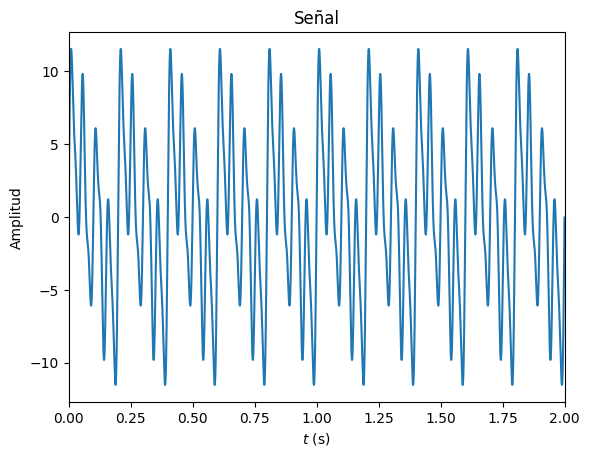

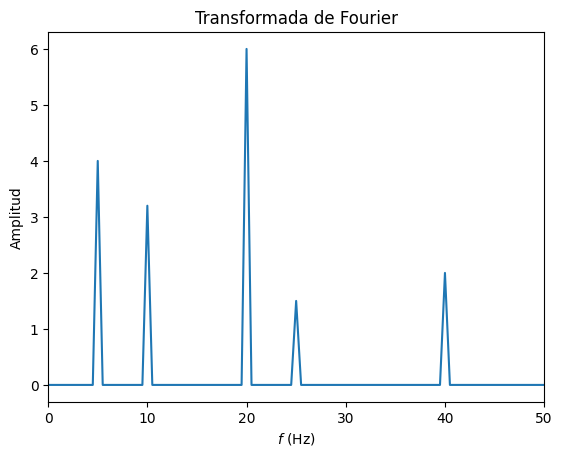

In [157]:
# constantes
muestreo = 44100
duracion1 = 2.0
frecuencias1 = array([5, 10, 20, 25, 40])
amplitudes1 = array([4.0, 3.2, 6.0, 1.5, 2.0])
# amplitudes = array([1.0, 2.0, 3.0, 4.0, 5.0]) # amplitudes for testing

# síntesis de la señal
t1 = arange(0.0, duracion1, 1/muestreo)
señal1 = zeros(t1.size)

# NOTE (MQ): con cálculo matricial es mucho más rápido
for i in range(frecuencias1.size):
    señal1 += amplitudes1[i] * sin(2*pi*frecuencias1[i] * t1)

# representación de la señal
plot(t1, señal1)
xlabel('$t$ (s)')
ylabel('Amplitud')
title('Señal')
xlim([0, duracion1])
show()

# cálculo de su espectro
espectroAmplutides1 = rfft(señal1)
espectroFrecuencias1 = linspace(0, señal1.size//(2*duracion1), int((muestreo*duracion1)/2) + 1)

# representación de los coeficientes de la fft
plot(espectroFrecuencias1, (1/espectroAmplutides1.size)*abs(espectroAmplutides1))
xlabel('$f$ (Hz)')
ylabel('Amplitud')
title('Transformada de Fourier')
xlim([0.0, 50.0])  # NOTE (MQ): la escala estaba mal. los picos deberían estar donde `frecuencias` indica, y estaban en el doble. ya está arreglado
show()

- Crear una señal de 10 segundos, donde la frecuencia de la señal varía cada 2 segundos, es decir, una señal donde tenemos 5 frecuencias y cada una de ellas sólo está presente durante 2 segundos. Representar la señal y obtener el espectro total de Fourier

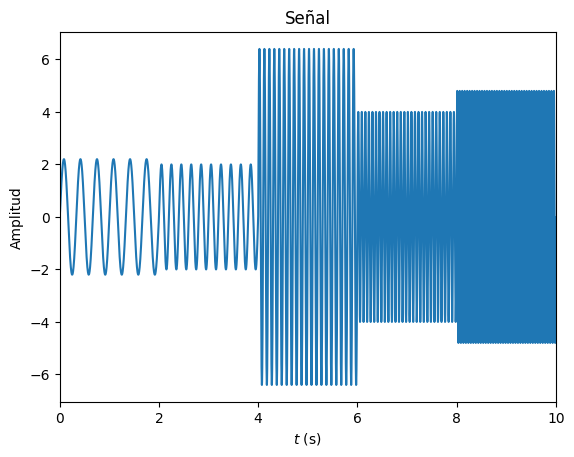

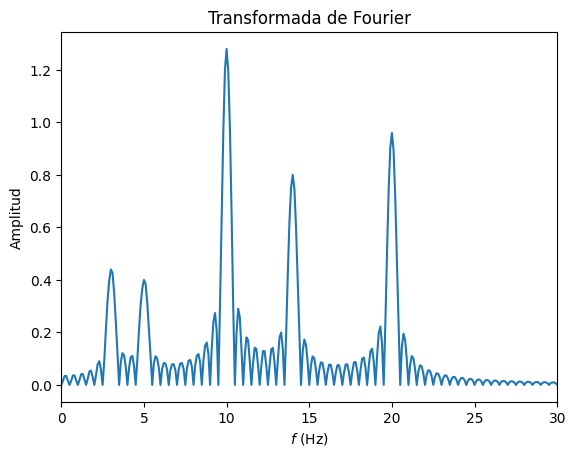

In [158]:
# constantes
duracion2 = 10.0
intervalo = 2.0
frecuencias2 = array([3, 5, 10, 14, 20])
amplitudes2 = array([2.2, 2, 6.4, 4.0, 4.8])
# amplitudes = array([1, 2, 3, 4, 5]) # amplitudes for testing

# síntesis de la señal
t2 = arange(0.0, duracion2, 1/muestreo)
señal2 = zeros(0)  # array vacío para añadir cada segmento
N = int(t2.size/(duracion2/intervalo))  # cantidad de muestras de cada segmento
for i in range(frecuencias2.size):
    señal2 = appendArray(señal2, amplitudes2[i] * sin(2*pi*frecuencias2[i] * t2[i*N:(i+1)*N]))

# representación de la señal
plot(t2, señal2)
xlabel('$t$ (s)')
ylabel('Amplitud')
title('Señal')
xlim([0, duracion2])
show()

# cálculo de su espectro
espectroAmplutides2 = rfft(señal2)
espectroFrecuencias2 = linspace(0, señal2.size//(2*duracion2), int((muestreo*duracion2)/2) + 1)

# representación de los coeficientes de la fft
plot(espectroFrecuencias2, (1/espectroAmplutides2.size)*abs(espectroAmplutides2))
xlabel('$f$ (Hz)')
ylabel('Amplitud')
title('Transformada de Fourier')
xlim([0.0, 30.0])
show()


Tal y como uno espera, la transformada de Fourier no distingue si una frecuencia desaparece de la señal o si perdura a lo largo de la misma. De esta manera se pierde cierta información que puede ser útil a la hora de analizar la señal, para su estudio o limpieza. Por el contrario, la SFT analiza trozos de la señal a lo largo del tiempo, de forma que se puede ver la evolución temporal de la misma.

### Apartado b:

- Definir una función SFT que tome como entrada la señal a estudiar, la frecuencia de muestreo, tamaño de los trozos a analizar (N) y cuanto se superponen las trozos que analizamos. Con esta información la función debe hacer lo siguiente:
   - Considerando el tamaño de los trozos y la superposición de los mismos, calcular el desplazamiento del segmento de trozo que analizamos
   - Calcular la cantidad de trozos que se deben analizar
   - Defina un vector (cos) del mismo tamaño que un trozo (N), cuyos elementos tomen los valores $x_i = 0.5-0.5cos(2\pi i/(N-1))$, con $i\in [0,N-1]$.
   - Cree un vector de ceros de tamaño N.
   - Definir un vector (v) de tamaño len(señal)+N, donde los N elementos finales sean cero y los primeros len(señal) sean la señal a analizar.
   - Crear un vector bidimensional de python de tipo flotante donde almacenar los resultados, es decir, con tantas filas como frecuencias vamos a tener, y tantas columnas como trozos se analizan.
   - Definir un loop que analice cada uno de los trozos, para lo cual debe realizar lo siguiente:
      - del vector v tomar el trozo de señal, de tamaño N que debemos analizar.
      - Suavizar los bordes del trozo usando el vector cos.
      - definimos un vector (datos) donde guardamos el trozo suavizado y a continuación N ceros.
      - Calculamos el espectro de Fourier
      - Guardamos en la columna correspondiente al trozo estudiado del vector resultados la primera mitad del espectro obtenido.
   - La función debe devolver el vector de resultados.
- Usando la función anterior, analizar y representar la evolución del espectro a lo largo del tiempo para la señal de 10 segundos de duración creada en los apartados anteriores. **AYUDA** El gráfico debe hacerse con imshow.

In [174]:

def sft(señal,f,N,sup):
    
    #si se introducen los inputs de tamaño de un trozo y la superposicion de los trozos en segundos (que resulta más intuitivo para el que lo usa)

    # N = int(tamaño*f)                
    # sup = int(solapamiento*f)

    #lo traducimos a samples
    
    #sup es la cantidad de los datos de un trozo con tamaño (N) que están superpuestos con otro trozo
    #de modo que el desplazamiento que debe haber desde que empieza un trozo hasta que empieza el siguiente debe ser
    desplazamiento = N-sup//2  #el /2 es debido a que (sup) representa los datos del trozo superpuestos a ambos lados, pero solo nos interesa los de uno de los lados
    
    # por tanto ahora se puede calcular el numero de trozos que debemos hacer de nuestra señal
    trozos = len(señal)//desplazamiento      #el numero de trozos que tendremos para analizar

    print('frecuencia de muestreo =', f)
    print('tamaño de la señal =', len(señal))
    print('N =',N)
    print('sup =',sup)
    print('desplazamiento =',desplazamiento)
    print('Número de trozos: ', trozos)
    
    cosvect = 0.5-0.5*cos(2*pi*linspace(0,N,N)/(N-1))    
    
    ceros = zeros(N,float)
    v = appendArray(señal,ceros)
    
    Datos = zeros([N+1,trozos],float)    

    for i in range(trozos):
        trozo=v[desplazamiento*i:desplazamiento*i+N]         #esto es para coger la sección de la señal por lo que hay que guiarse por el parámetro desplazamiento, no N
        trozoHann=(trozo)*cosvect                            #suavizado de la señal usando el vector (cos), tambien llamado "Hann window"
        espectroi = rfft(appendArray(trozoHann,ceros))                          
        # if i == 0:                                                            #esto era para tests
        #     print('tamaño trozo sin ceros', len(trozoHann))
        #     print('tamaño trozo con ceros', len(datoss))
        #     print('tamaño del rfft(trozo con ceros)', len(espectroi))
        Datos[:,i]=abs(espectroi)                            #al hacer el abs creo que perdemos información si luego queremos hacer una inversa (nose)
    
    return Datos, trozos

#para representar lo calculado
def espectro_sft(señal,f,N,sup,flimit):         #flimit es un parametro para poder ajustar el mishow si queda muy abajo
    Datos = sft(señal,f,N,sup)[0]
    fig, ax = subplots(figsize=(30, 12))
    freclimit = (N+1)//flimit
    xlabel('Tiempo (s)')
    ylabel('Frecuencias (Hz)')
    ax.imshow(Datos[:freclimit,:], origin='lower',aspect='auto',extent=[0,len(señal)//f,0,(f//2-1)//flimit])       #al ser un input real, el espectro útil solo va de 0---sr/2 Hz. El -1 es porque no se qué pollas hace rfft

#transformada inversa por trozos (intuyo que va a haber un problema por hacer el abs en sft)
def isft(Datos,frec_muestreo,N,sup):
    desplazamiento = N-sup//2
    iseñal = zeros(len(Datos[0,:])*N)
    cosvect = 0.5-0.5*cos(2*pi*linspace(0,N,N)/(N-1))
    for i in range(len(Datos[0,:])):
        iseñal[i*desplazamiento:i*desplazamiento+N]=irfft(Datos[:,i])[:N]
    return iseñal


#para el extra (si da tiempoy se me ocurre algo)
def señal_antiruido(señal,f,N,sup):
    Datos_ruido,trozos=sft(señal[:10*f],f,N,sup)
    #detectar una frecuencia que se repite continuamente e identificar de que tipo es el ruido
    #crear una señal de ese mismo tipo en negativo que dure lo que dura la canción
    antirruido=[]
    return antirruido


frecuencia de muestreo = 44100
tamaño de la señal = 441000
N = 44100
sup = 22050
desplazamiento = 33075
Número de trozos:  13


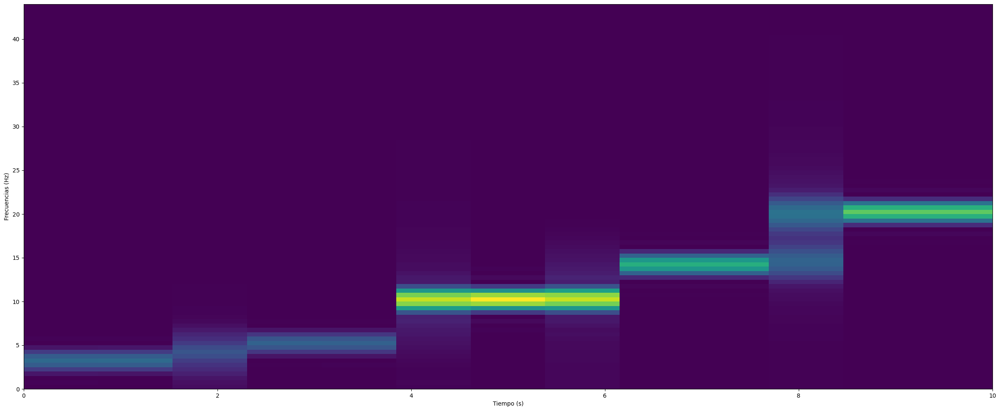

In [160]:
#señal de 10 segundos del apartado anterior

muestreo = 44100

espectro_sft(señal2,muestreo,muestreo,muestreo//2,500)         #flimit tiene que ser muy grande porque las frecuencias son muy bajas


- Usando la función SFT, analizar la señal contenida en el archivo `pista1.wav` que se carga a continuación y representar la SFT para la señal.

In [161]:
import IPython.display as ipd   #Librerias para leer archivos de audio
from scipy.io import wavfile    #esta también funciona de scipy
import librosa
import librosa.display

#librosa por defecto te resamplea los datos, y te los normaliza (valores entre -1 y 1)
señal, frec_muestreo = librosa.load("pista1.wav")     #si pones sr='None' debería darte la frec_muestreo original del archivo, pero da error

In [162]:
#Para escuchar el audio
ipd.Audio(señal,rate=frec_muestreo)

el archivo dura  88.34036281179138  segundos
el archivo dura  1  minutos y 28.34036281179138  segundos
señal librosa = 1947905 <class 'numpy.ndarray'>
la frecuencia de muestreo de librosa = 22050


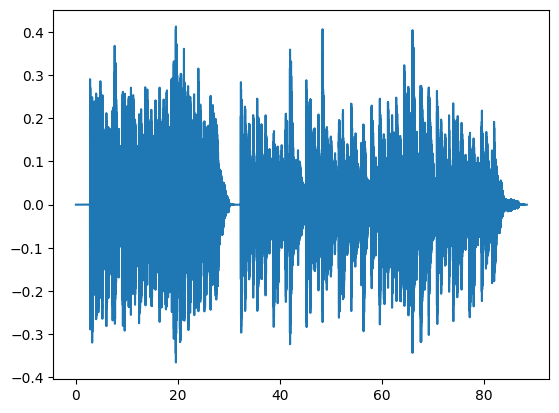

señal scipy = 4240336 <class 'numpy.ndarray'>
la frecuencia de muestreo de scipy = 48000


In [163]:
duracion = len(señal)/frec_muestreo
print("el archivo dura ",duracion, " segundos")
print("el archivo dura ",int(duracion/60-duracion%60/60), " minutos y", (duracion%60), " segundos")

tiempo = arange(0.0,duracion,1/frec_muestreo)

print('señal librosa =',len(señal),type(señal))
print('la frecuencia de muestreo de librosa =', frec_muestreo)
plot(tiempo, señal)
# xlim()
show()



#esto no lo usamos, es solo para mostrar que scipy da otro tipo de datos al leer el .wav (dos canales, el doble de datos por canal que librosa, y mayor frecuencia de muestreo)
nu, signal = wavfile.read('pista1.wav')
print('señal scipy =',len(signal[:,0]),type(signal))
print('la frecuencia de muestreo de scipy =', nu)

frecuencia de muestreo = 22050
tamaño de la señal = 1947905
N = 2048
sup = 512
desplazamiento = 1792
Número de trozos:  1087


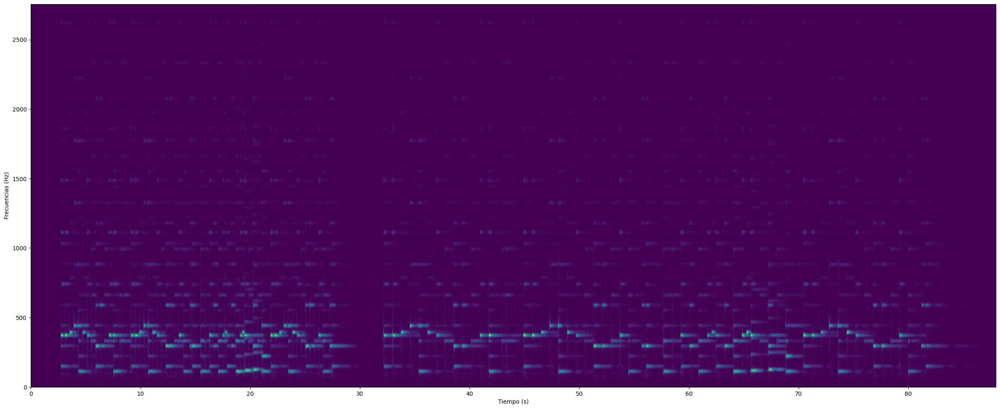

In [164]:
N=int(2**10)                #las potencias de 2 creo que funcionan mejor para rfft()
sup=int(2**9)
espectro_sft(señal,frec_muestreo,int(2**11),int(2**9),4)        #flimit=4 va bien para ver la melodía y los armónicos

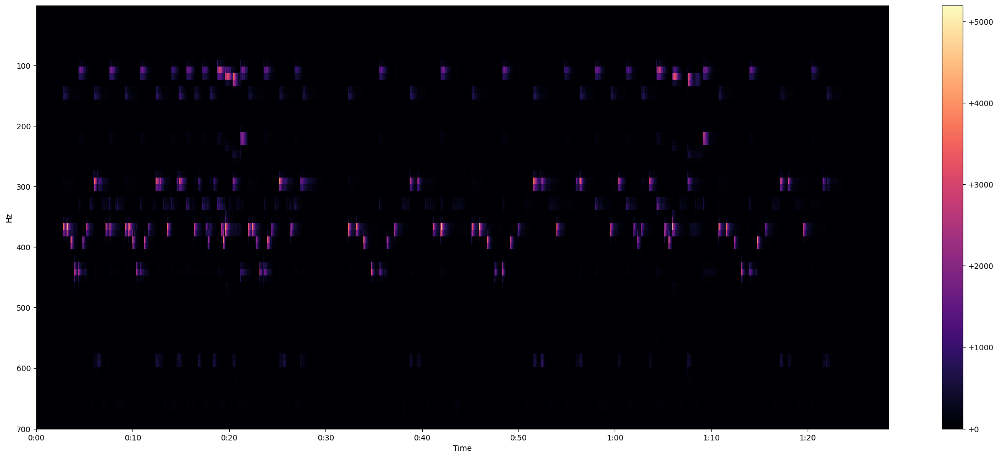

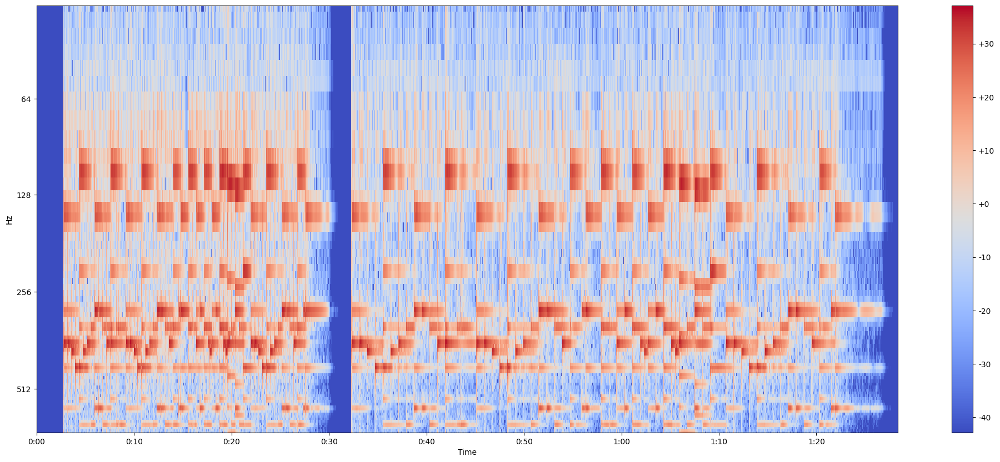

In [165]:
#LAS FUNCIONES DE LIBROSA

samples = 2048
hop = 512           #estándares en la stft de audio

signal, sr = librosa.load("pista1.wav")

scale = librosa.stft(signal, n_fft=samples, hop_length=hop)

Yscale = abs(scale)**2

def espectrograma(Y, sr, hop_length, y_axis="linear"):
    figure(figsize=(25,10))
    ylim(700)
    librosa.display.specshow(Y, sr=sr, hop_length=hop_length, x_axis="time", y_axis=y_axis)
    colorbar(format="%+2.f")

espectrograma(Yscale,sr,hop)

Ylog = librosa.power_to_db(Yscale)
espectrograma(Ylog,sr,hop,y_axis="log")

### Apartado c:

- Viendo el espectro a lo largo del tiempo, añadir a la señal anterior "ruido" con frecuencia muy alta (o muy baja) y volver a analizar la señal resultante. **AYUDA**: usar una amplitud del orden de 0.1 para el "ruido"

frecuencia de muestreo = 22050
tamaño de la señal = 1947905
N = 2048
sup = 512
desplazamiento = 1792
Número de trozos:  1087


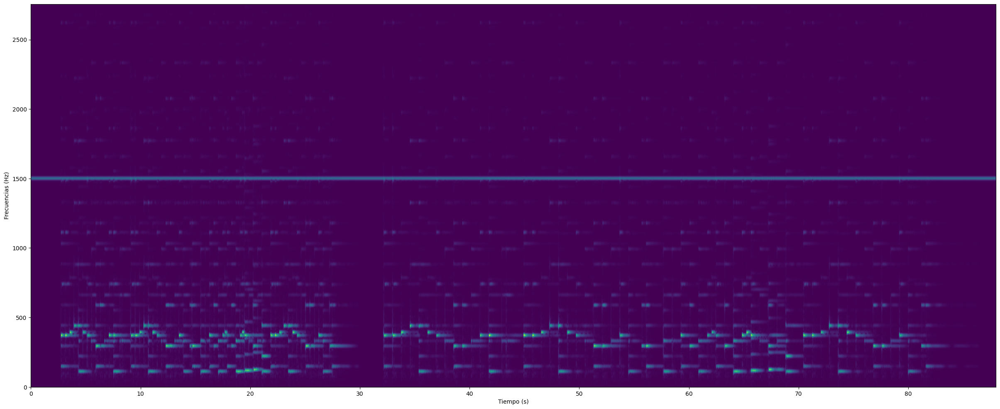

In [166]:
Nruido=2**11
fruido = 1500 #Hz
ruido = 0.05*cos(2*pi*fruido*arange(0,len(señal)/frec_muestreo,1/frec_muestreo))
señal_ruido = señal + ruido
espectro_sft(señal_ruido,frec_muestreo,2**11,2**9,4)

In [167]:
ipd.Audio(señal_ruido,rate=frec_muestreo)

En muchas situaciones, pueden producirse estos ruidos indeseados. Según la situación en la que nos encontremos puede procederse de dos formas: En caso de haber ruido en los datos, se suelen aplicar filtro, es decir, se eliminan aquellas frecuencias molestas del espectro y se utiliza la transformada de Fourier inversa para recuperar la señal limpia. Otras veces, por ejemplo al escuchar música con unos auriculares, el ruido es ajeno al dispositivo. Sin embargo, hoy en día somos capaces de analizar dicho ruido (mediante el micrófono por ejemplo) y hacer que la señal emitida incluya una componente que anula el ruido ambiente.

- Haced la transformada de Fourier de la señal completa (incluido el ruido), aplicad un filtro (el que convenga según la situación) para eliminar el ruido (considerad que lo habéis construido vosotros y tenéis información del mismo). Para construir el filtro, definid un vector del mismo tamaño que la TF que tome valores 0 ó 1 según si las frecuencias queremos eliminarlas o no. Una vez limpiada la señal, volved a calcular la SFT y comprobad que se recupera el resultado original de la señal.

In [168]:
Datos = sft(señal_ruido, frec_muestreo,2**11,2**9)[0]
Datos[fruido*((2**11)//2)//frec_muestreo,:]=0.0
iseñal = isft(Datos,frec_muestreo, int(2**11),int(2**9))

frecuencia de muestreo = 22050
tamaño de la señal = 1947905
N = 2048
sup = 512
desplazamiento = 1792
Número de trozos:  1087


frecuencia de muestreo = 22050
tamaño de la señal = 2226176
N = 2048
sup = 512
desplazamiento = 1792
Número de trozos:  1242


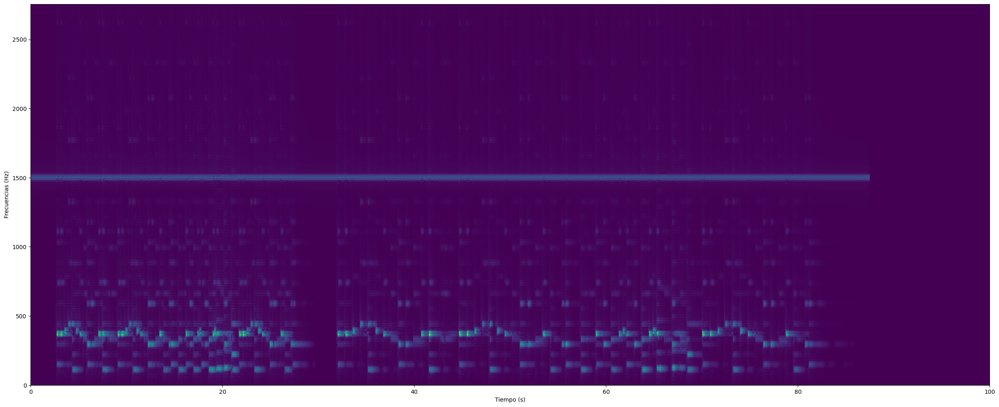

In [169]:
espectro_sft(iseñal,frec_muestreo,2**11,2**9,4)

#hay un fallo con los tamaños del señal original y la invertida
#pero me he fijado que el numero de elementos que sobran de la nueva señal es curiosamente sup/2*trozos
#así que tendra que ver con algo que he ajustado mal en isft()

#ah, y la eliminación de ruido no consigo que funcione XD

**EXTRA** Usando los primeros 10 segundos de la señal con ruido, cread una señal que cancele el ruido para el resto de la señal. Añadirlo a la señal con el ruido y volved a representar la SFT